# Short Term Water Demand Forecasting with Statistical and AI Methods

### Oscar Wooding
Department of Civil and Environmental Engineering, Imperial College London

### Initial Statistical Analysis


In [1]:
# imports 
import sys
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import rc
import matplotlib_inline
import datetime as dt
import warnings
from scipy import stats

from sklearn.impute import KNNImputer
from statsmodels.tsa.seasonal import MSTL
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor

%matplotlib inline

# improve matlab output
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

rc('text', usetex=False)
plt.rc('font', size=10)          # controls default text sizes
plt.rc('axes', titlesize=12)     # fontsize of the axes title
plt.rc('axes', labelsize=11)     # fontsize of the x and y labels
plt.rc('xtick', labelsize=10)    # fontsize of the tick labels
plt.rc('ytick', labelsize=10)    # fontsize of the tick labels
plt.rc('legend', fontsize=10)    # legend fontsize
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

# adjust the format of the data set
pd.options.display.float_format = '{:,.4f}'.format
np.set_printoptions(precision=2)

warnings.filterwarnings("ignore")


### *Load*

In [2]:
# load inflow data
inflow_data = pd.read_csv("../data/InflowData.csv")

# make list with dma names
dma_list = list(inflow_data.columns.values[1:])

# change index of inflow dataframe to time step
inflow_data = inflow_data.set_index('date_time')

# change index format to datetime
inflow_data.index = pd.to_datetime(inflow_data.index, format="%d/%m/%Y %H:%M")

# remove dupes
inflow_data = inflow_data[~inflow_data.index.duplicated(keep='first')]

# # print first two rows
inflow_data.head(3)


,dma_a,dma_b,dma_c,dma_d,dma_e,dma_f,dma_g,dma_h,dma_i,dma_j
date_time,,,,,,,,,,
2021-01-01 00:00:00,NaN,NaN,3.7000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 01:00:00,NaN,NaN,3.5600,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 02:00:00,NaN,NaN,3.2700,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# load weather data
weather_data = pd.read_csv("../data/WeatherData.csv")

# change index of weather dataframe to time step
weather_data = weather_data.set_index('date_time')

# change index format to datetime
weather_data.index = pd.to_datetime(weather_data.index, format="%d/%m/%Y %H:%M")

weather_data_imputed = weather_data.fillna(method='bfill')
weather_data = weather_data[~weather_data.index.duplicated(keep='first')]

# # print first two rows
weather_data_imputed.head(3)

,rain_depth,air_temp,air_humid,windspeed
date_time,,,,
2021-01-01 00:00:00,0.0000,7.2000,79.0000,9.0000
2021-01-01 01:00:00,0.0000,7.3000,79.0000,6.0000
2021-01-01 02:00:00,0.0000,7.6000,78.0000,4.0000


In [4]:
# visualise missing data
fig, axs = plt.subplots(11, 1, figsize=(12, 24))

colors = [
    "#ff7f0e",  # Orange
    "#1f77b4",  # Blue
    "#2ca02c",  # Green
    "#d62728",  # Red
    "#9467bd",  # Purple
    "#8c564b",  # Brown
    "#e377c2",  # Pink
    "#7f7f7f",  # Gray
    "#bcbd22",  # Yellow-Green
    "#17becf"   # Cyan
]

for i, col in enumerate(inflow_data.columns): 
    axs[i].plot(inflow_data[col], label=col)
    
    for index, row in inflow_data[inflow_data[col].isna()==True][[col]].iterrows(): 
        if row.isna().sum() / len(row) > 0.5: 
            axs[i].axvline(x=index, ymin=0, ymax=1, color='r')
            axs[10].axvline(x=index, ymin=i/10, ymax=(i+1)/10, color=colors[i], label=col)
    
    perc_data_missing = inflow_data[col].isna().sum() / len(inflow_data[col])
    axs[i].set_title(f"{col} : perc. data missing - {perc_data_missing:.2f}")
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Demand')

axs[10].set_title('Comparison of missing data')
axs[10].set_xlabel('Date')
axs[10].set_xlim(inflow_data.index[0], inflow_data.index[-1])

fig.tight_layout()
plt.show()

### Comment on Missing Data

- Most of the dmas have a large portion of missing data 
- Large missing blocks are very difficult to impute accurately, alternative measures should be used or data removed
- Data missing in different patterns across all dmas, however there is still a large amount of overlap
- 

In [5]:
# Get data to test imputation methods
# find longest uninterrupted stretch for all dma

test_sets = {}

for dma in inflow_data.columns: 
    start = 0
    temp_start = 0
    end = 0
    window = 0
    temp = 0
    
    for i, check in enumerate(inflow_data[dma].isna()): 
        if check == False: 
            temp += 1
        else: 
            temp = 0
            temp_start = i
        
        if temp > window: 
            window = temp
            end = i
            start = temp_start
    
    test_sets[dma] = inflow_data.iloc[start+1:end][[dma]]
    

In [6]:
# plot longest windows
fig, axs = plt.subplots(10, 1, figsize=(8, 24))

for i, col in enumerate(inflow_data.columns): 
    axs[i].plot(inflow_data[col], label=col)
    
    for index, row in inflow_data[inflow_data[col].isna()==True][[col]].iterrows(): 
        if row.isna().sum() / len(row) > 0.5: 
            axs[i].axvline(x=index, ymin=0, ymax=1, color='r')
    
    axs[i].plot(test_sets[col], color='orange', label='largest available set')
    
    perc_data_missing = inflow_data[col].isna().sum() / len(inflow_data[col])
    axs[i].set_title(f"{col} : largest window - {len(test_sets[col])}")
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Demand')

fig.tight_layout()
plt.show()

#select dma E, H, I

In [7]:
# extract different windows of data sets and apply to test sets

# set of different missing data combinations for each test set
artificial_missing = {dma: {} for dma in ['dma_e', 'dma_h', 'dma_i']}

# for each dma, slice into sections with different missing data patterns
for test_dma in ['dma_e', 'dma_h', 'dma_i']: 
    # get example missing data patterns from each dma
    test_no = 0
    for dma in inflow_data.columns: 
        window_len = 2250 # shortest set from e, h, i
        test_sets[test_dma] = test_sets[test_dma][0:window_len]
        
        i = window_len
        while i < len(inflow_data): 
            # get window and associated missing value positions
            missing_vals = inflow_data.isna().iloc[i-window_len:i][[dma]].set_index(test_sets[test_dma].index)
            # map location of missing values onto test set
            artificial_missing[test_dma][test_no] = test_sets[test_dma].copy()
            artificial_missing[test_dma][test_no][missing_vals[dma]==True] = np.nan
            
            i += window_len
            test_no += 1
            

In [8]:
# plot example of artificial sets
from matplotlib.dates import DateFormatter
date_formatter = DateFormatter('%b %Y')

fig, axs = plt.subplots(10, 3, figsize=(12, 24))

for j, test_dma in enumerate(['dma_e', 'dma_h', 'dma_i']): 
    for i in np.arange(10): 
        df_example = artificial_missing[test_dma][4*i]
        axs[i][j].plot(df_example, label=col)

        # highlight missing data
        for index, row in df_example[df_example[test_dma].isna()==True].iterrows(): 
            if row.isna().sum() / len(row) > 0.5: 
                axs[i][j].axvline(x=index, ymin=0, ymax=1, color='r')

        axs[i][j].set_title(f"Example Artificial Missing Data: {test_dma}")
        axs[i][j].tick_params(axis='x', rotation=45)  # Rotate x-axis tick labels by 45 degrees
        axs[i][j].xaxis.set_major_formatter(date_formatter)
        axs[i][j].set_xlabel('Date')
        axs[i][j].set_ylabel('Demand')

fig.tight_layout()
plt.show()


### Imputing Techniques

#### 1. Deletion

Deletion is appropriate when the amount of missing data is very small, such that it represents a negligible portion of the total dataset. It is also used when the missing data is Missing Completely at Random (MCAR), meaning that there are no patterns in the missing data.

#### 2. Last Observation Carried Forward / Next Observation Carried Backwards

LOCF can be useful in time-series data where there is a trend or pattern that continues from one time point to the next. It’s also useful when the data is collected at regular intervals, and the values are relatively stable or change slowly over time.

In [9]:
import copy

In [10]:
# fit method to artificial missing data
artificial_imputed_nocf = copy.deepcopy(artificial_missing)

for dma in artificial_imputed_nocf.keys(): 
    print(f"Running test for {dma}")
    for test in artificial_imputed_nocf[dma]:
        df = artificial_imputed_nocf[dma][test]
         # impute
        df_imputed = df.fillna(method="ffill", limit=None)
        df_imputed = df_imputed.fillna(method="bfill", limit=None)
        # save result
        artificial_imputed_nocf[dma][test]= df_imputed
        

Running test for dma_e
Running test for dma_h
Running test for dma_i


In [11]:
# check imputation for remaining nans
nan_vals = 0
for dma in artificial_imputed_nocf.keys(): 
    for test in artificial_imputed_nocf[dma].keys(): 
        nan_vals += int(artificial_imputed_nocf[dma][test].isna().sum())

nan_vals


0

#### 3. Mean / Median Day Fill

Mean/Median/Mode imputation can be used when the data is missing completely at random (MCAR). If the missing data is not random, this method can lead to biased and inefficient estimates.

Mean/Median/Mode imputation can lead to an underestimate of the variance, which can lead to biased estimates of the covariances and correlations. This can affect the model’s ability to accurately capture the relationships between variables. Therefore, it’s important to carefully consider the nature of the missing data before using this method.

In [12]:
# Mean Day Impute
def SimpleStatDayImpute(df, dma, stat='mean', res_window=48): 
    """
    Fills missing data values with the average for that day 
    and hour
    
    df - total dataframe of all dma
    dma - dma of interest
    
    """
    
    # exponential mean component
    avg_df = df[[dma]].copy() 
    avg_df['mean'] = 0
    
    # fill with nan mean for insufficient data for exponential
    avg_df['day'] = avg_df.index.weekday
    avg_df['hour'] = avg_df.index.hour
    
    if stat == 'mean': 
        avg_values = avg_df.groupby(by=['day', 'hour']).mean()[dma]
    elif stat == 'median': 
        avg_values = avg_df.groupby(by=['day', 'hour']).median()[dma]
        
    for idx, row in avg_df.iterrows(): 
        avg_df.loc[idx, 'mean'] = avg_values.loc[row.day, row.hour]
        
    # residual correction component
    avg_df['residual'] = avg_df[dma] - avg_df['mean']
    avg_df['res_correction'] = avg_df['residual'].rolling(window=res_window).mean()
    avg_df['mean'] = avg_df['mean'] + avg_df['res_correction'].fillna(0)
    
    return avg_df['mean']


In [13]:
# fit method to artificial missing data
artificial_imputed_mean = copy.deepcopy(artificial_missing)
artificial_imputed_median = copy.deepcopy(artificial_missing)

for dma in artificial_missing.keys(): 
    print(f"Running test for {dma}")
            
    for test in artificial_missing[dma]:
        df1 = artificial_imputed_mean[dma][test]
        df2 = artificial_imputed_median[dma][test]
        
        missing_dma_indices = df1[df1.isna().all(axis=1)].index

        # 1. apply mean method
        # where partner data not available replace with avg.
        df1.loc[missing_dma_indices, dma] = SimpleStatDayImpute(df1, dma, stat='mean')[missing_dma_indices]
        df2.loc[missing_dma_indices, dma] = SimpleStatDayImpute(df2, dma, stat='median')[missing_dma_indices]
        
        # save result
        artificial_imputed_mean[dma][test][dma] = df1[dma]
        artificial_imputed_median[dma][test][dma] = df2[dma]
        

Running test for dma_e
Running test for dma_h
Running test for dma_i


In [14]:
# check imputation for remaining nans
nan_vals = 0
for dma in artificial_imputed_mean.keys(): 
    for test in artificial_imputed_mean[dma].keys(): 
        nan_vals += int(artificial_imputed_mean[dma][test].isna().sum())

nan_vals


0

#### 4. Rolling Statistics

Rolling Statistics Imputation is particularly effective for time series data with temporal dependencies. It can handle situations where the missing data is Missing At Random (MAR) or Not Missing At Random (NMAR). This method assumes that nearby points in time are more similar to each other, which often holds true for time series data.

> Often appears that there is not enough data to impute many points

In [15]:
# fit method to artificial missing data
artificial_imputed_rolling = copy.deepcopy(artificial_missing)

for dma in artificial_missing.keys(): 
    print(f"Running test for {dma}")
    for test in artificial_missing[dma]:
        df = artificial_imputed_rolling[dma][test]
         # impute
        df = df.fillna(df.rolling(window=5, min_periods=1).mean().shift(1)[[dma]])
        
        # save result
        artificial_imputed_rolling[dma][test]= df
        
        # fill remaing gaps with simple mean
        missing_dma_indices = df[df.isna().all(axis=1)].index
        artificial_imputed_rolling[dma][test].loc[missing_dma_indices, dma] = SimpleStatDayImpute(artificial_imputed_rolling[dma][test], dma, stat='mean')[missing_dma_indices]
        

Running test for dma_e
Running test for dma_h
Running test for dma_i


In [16]:
# check imputation for remaining nans
nan_vals = 0
for dma in artificial_imputed_rolling.keys(): 
    for test in artificial_imputed_rolling[dma].keys(): 
        nan_vals += int(artificial_imputed_rolling[dma][test].isna().sum())

nan_vals


0

#### 5. Linear Interpolation

Linear interpolation is suitable when the data shows a linear trend between the observations. It’s not suitable for data that shows a nonlinear trend or seasonal pattern as it will almost distort the seasonal pattern at all.

#### 6. Spline Interpolation

Spline interpolation is used when the data is numeric and continuous, and you want to avoid the problem of overfitting that can occur with polynomial interpolation. Provides a smoother fit than linear interpolation. 

In [17]:
# Apply the spline interpolation method
df_imputed = df.interpolate(method='spline', limit_direction='forward', order=2)

# fit method to artificial missing data
artificial_imputed_spline = copy.deepcopy(artificial_missing)

for dma in artificial_missing.keys(): 
    print(f"Running test for {dma}")
    for test in artificial_missing[dma]:
        df = artificial_imputed_spline[dma][test]
         # impute
        df_imputed = df.interpolate(method='spline', limit_direction='forward', order=2)
        df_imputed = df_imputed.fillna(method="bfill", limit=None)
        
        # save result
        artificial_imputed_spline[dma][test]= df_imputed
        

Running test for dma_e
Running test for dma_h
Running test for dma_i


In [18]:
# check imputation for remaining nans
nan_vals = 0
for dma in artificial_imputed_spline.keys(): 
    for test in artificial_imputed_spline[dma].keys(): 
        nan_vals += int(artificial_imputed_spline[dma][test].isna().sum())

nan_vals


0

#### 7. Regression Imputation

Regression imputation can be used when the data is numeric and there is a strong correlation between the variable with missing values and other variables. Makes use of the relationship between variables.

Regression imputation can lead to more accurate models by making use of the relationships between variables. However, it can also lead to an overestimate of the correlation between variables, which can affect the model’s performance.


#### 8. KNN 

The KNN imputation method works by finding the K-nearest neighbors to the observation with missing data and then imputing them based on the non-missing values in the neighbors. KNN can be used when the data are missing at random, and the variables are almost equally important. KNN is better when the data are uniformly distributed, and it’s not suitable for high dimensional data.

KNN imputation can introduce bias into the data if the missing data mechanism isn’t random. This is because the KNN algorithm relies on the assumption that similar observations exist in the dataset. If this assumption is violated, the imputed values may be far from the true values, leading to biased estimates in the model-building process.

#### *Methodology*

1. Find comparison partner to regress against by considering highest correlation (across past 3 months) pair for chosen dma.  
2. KNN Imputation with correlated partner. 

#### *Thoughts*

- Try based on weather / temp. 

In [19]:
### FUNCTIONS ###
# Mean Day Impute
def MeanDayImpute(df, dma, lag=5, memory=0.4, res_window=10): 
    """
    Fills missing data values with the average for that day 
    calcuated as an exponential average of the past (lag)
    occurances for that time and day.
    
    df - total dataframe of all dma
    dma - dma of interest
    lag - number of past values averaged
    memory - importance of recent values
    res_window - window used to average rolling residual
    
    """
    
    # exponential mean component
    avg_df = df[[dma]].copy() 
    avg_df['mean'] = 0
    
    for delta in np.arange(lag, 0, -1):
        avg_df[dma+str(delta)] = avg_df[dma].fillna(method='bfill').shift(24*7*delta)
        
        if delta == lag: 
            avg_df['mean'] = avg_df[dma+str(delta)]
        else:
            avg_df['mean'] = avg_df['mean']*(1-memory) + avg_df[dma+str(delta)]*memory
        
    # fill with nan mean for insufficient data for exponential
    avg_df['day'] = avg_df.index.weekday
    avg_df['hour'] = avg_df.index.hour
    avg_values = avg_df.groupby(by=['day', 'hour']).mean()[dma]
    
    # residual correction component
    avg_df['residual'] = avg_df[dma] - avg_df['mean']
    avg_df['res_correction'] = avg_df['residual'].rolling(window=res_window).mean()
    avg_df['mean'] = avg_df['mean'] + avg_df['res_correction'].fillna(0)
    
    for idx, row in avg_df[avg_df['mean'].isna()].iterrows(): 
        avg_df.loc[idx, 'mean'] = avg_values.loc[row.day, row.hour]
    
    return avg_df['mean']


# Correlation Partners
def CorrPartner(data, thresh=0.7, period=12):
    """
    Finds dmas which have a correlation over the threshold
    across the specified period in weeks
    
    thresh - correlation threshold for partner to be considered
    period - number of weeks to consider correlation over
    
    """
    # Find comparison partner
    df = data.copy()
    correlation = df[df.index[-1]-dt.timedelta(weeks=period)::].corr()
    correlation = correlation[correlation!=1]
    partners = {
        dma: list(correlation[(correlation[dma]>=thresh)].index) 
        for dma in correlation.columns
    }
    
    return partners

def KNNImpute(df, dma, partners, k=3): 
    """
    Imputes data using kNN alogrithm for correlated dmas
    
    df - dataframe to impute
    k - number of neighbours
    dma - dma to impute
    
    """
    # Initialize the KNN imputer with k=5
    
    # scale
    scaler = {}
    imputer = KNNImputer(n_neighbors=k)
    cols = partners[dma]+[dma]  # correlated partner set
    
    for dma in cols: 
        values = df[dma].values
        values = values.reshape((len(values), 1))
        # train the standardization
        scaler[dma] = StandardScaler()
        scaler[dma] = scaler[dma].fit(values)
        standardized = scaler[dma].transform(values)
        df[dma] = standardized.flatten()
        
    fit = imputer.fit_transform(df[cols])
    imputed_df = pd.DataFrame(fit, columns=partners[dma]+[dma], index=df.index)
    
    for dma in cols: 
        values = imputed_df[dma].values
        values = values.reshape((len(values), 1))
        standardized = scaler[dma].inverse_transform(values)
        imputed_df[dma] = standardized.flatten()
    
    return imputed_df

def IterativeImpute(df, dma, partners): 
    """
    Imputes data using kNN alogrithm for correlated dmas
    
    df - dataframe to impute
    k - number of neighbours
    dma - dma to impute
    
    """
    # Initialize the IterativeImputer imputer with k=5
    
    # scale
    scaler = {}
    imputer = IterativeImputer(
        estimator=RandomForestRegressor(        
            n_estimators=4,
            max_depth=10,
            bootstrap=True,
            max_samples=0.5,
            n_jobs=2,
            random_state=0
        )
    )
    
    cols = partners[dma]+[dma]  # correlated partner set
    
    for dma in cols: 
        values = df[dma].values
        values = values.reshape((len(values), 1))
        # train the standardization
        scaler[dma] = StandardScaler()
        scaler[dma] = scaler[dma].fit(values)
        standardized = scaler[dma].transform(values)
        df[dma] = standardized.flatten()
        
    fit = imputer.fit_transform(df[cols])
    imputed_df = pd.DataFrame(fit, columns=partners[dma]+[dma], index=df.index)
    
    for dma in cols: 
        values = imputed_df[dma].values
        values = values.reshape((len(values), 1))
        standardized = scaler[dma].inverse_transform(values)
        imputed_df[dma] = standardized.flatten()
    
    return imputed_df
    
def RegressionImpute(df, dma, partners): 
    """
    Imputes data using regression for most correlated dma
    
    df - dataframe to impute
    k - number of neighbours
    dma - dma to impute
    
    """
    df_imputed = df.copy()
    
    # Instantiate the model
    model = LinearRegression()

    # Reshape data for model fitting (sklearn requires 2D array for predictors)
    partner = partners[dma][-1]
    X = df[partner].values.reshape(-1, 1)
    Y = df_non_missing['sales'].values

    # Fit the model
    model.fit(X, Y)

    # Get indices of missing sales
    missing_sales_indices = df_imputed[df_imputed[dma].isnull()].index

    # Predict missing sales values
    predicted_sales = model.predict(df_imputed.loc[missing_sales_indices, partner].values.reshape(-1, 1))

    # Fill missing sales with predicted values
    df_imputed.loc[missing_sales_indices, dma] = predicted_sales
    
    return df_imputed[dma]


#### *Validate Method*


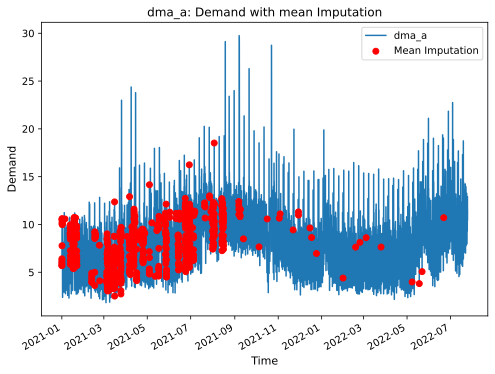

In [20]:
# testing
df_ini = inflow_data.copy()
df = df_ini.copy()

# get correlation partners
partners = CorrPartner(df, thresh=0.95, period=12)
missing_dma_indices = {}

# Fill first with average day where partners both have nan value
for dma in df.columns: 
    # where partner data not available replace with avg.
    cols = partners[dma]+[dma]  # correlated partner set
    missing_dma_indices[dma] = df[df[cols].isna().all(axis=1)].index
    df.loc[missing_dma_indices[dma], dma] = MeanDayImpute(df, dma, res_window=3)[missing_dma_indices[dma]]

    
# Plot initial mean values filled
dma = 'dma_a'
plt.figure(figsize=(8, 6))
df[dma].plot(style='-', label=dma, zorder=0)

# Add points where data was imputed
plt.scatter(missing_dma_indices[dma], df.loc[missing_dma_indices[dma], dma], color='red', label='Mean Imputation', zorder=1)

# Set title and labels
plt.title(f"{dma}: Demand with mean Imputation")
plt.xlabel('Time')
plt.ylabel('Demand')
plt.legend()
plt.show()


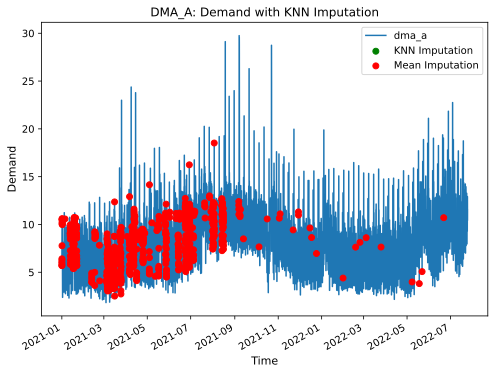

In [21]:
# Apply the KNN imputer
# Note: the KNNImputer requires 2D array-like input, hence the double brackets.
df_imputed = df.copy()
imputed_indices = {}

for dma in df_imputed.columns: 
    imputed_indices[dma] = df[df[dma].isna()].index
    df_imputed[partners[dma]+[dma]] = KNNImpute(df, dma, partners, k=3)

# Create a plot of all imputed values
dma = 'dma_a'
plt.figure(figsize=(8,6))
df_imputed[dma].plot(style='-', label=dma, zorder=0)


# Add points where data was imputed
plt.scatter(imputed_indices[dma], df_imputed.loc[imputed_indices[dma], dma], color='green', label='KNN Imputation', zorder=2)
plt.scatter(missing_dma_indices[dma], df_imputed.loc[missing_dma_indices[dma], dma], color='red', label='Mean Imputation', zorder=1)

# Set title and labels
plt.title(f"DMA_A: Demand with KNN Imputation")
plt.xlabel('Time')
plt.ylabel('Demand')
plt.legend()
plt.show()


#### *Apply KNN to test set* 

In [22]:
# fit method to artificial missing data
artificial_imputed_knn = copy.deepcopy(artificial_missing)

# get correlation partners
partners = CorrPartner(inflow_data, thresh=0.8, period=12)
missing_dma_indices = {}

for dma in artificial_missing.keys(): 
    print(f"Running test for {dma}")
            
    for test in artificial_missing[dma]:
        
        reduced_inflow_data = inflow_data.loc[artificial_missing[dma][test].index].copy()
        df = artificial_imputed_knn[dma][test]
        reduced_inflow_data[dma] = artificial_missing[dma][test][dma]

        # apply kNN
        df[dma] = KNNImpute(reduced_inflow_data, dma, partners, k=3)[dma]
        
        # save result
        artificial_imputed_knn[dma][test][dma] = df[dma]
        

Running test for dma_e
Running test for dma_h
Running test for dma_i


In [23]:
# check imputation for remaining nans
nan_vals = 0
for dma in artificial_imputed_knn.keys(): 
    for test in artificial_imputed_knn[dma].keys(): 
        nan_vals += int(artificial_imputed_knn[dma][test].isna().sum())

nan_vals


0

#### *Apply missForest to test set* 

In [24]:
# fit method to artificial missing data
artificial_imputed_mf = copy.deepcopy(artificial_missing)

# get correlation partners
partners = CorrPartner(inflow_data, thresh=0.4, period=12)
missing_dma_indices = {}

for dma in artificial_missing.keys(): 
    print(f"Running test for {dma}")
            
    for test in artificial_missing[dma]:
        
        reduced_inflow_data = inflow_data.loc[artificial_missing[dma][test].index].copy()
        df = artificial_imputed_mf[dma][test]
        reduced_inflow_data[dma] = artificial_missing[dma][test][dma]

        # apply kNN
        df[dma] = IterativeImpute(reduced_inflow_data, dma, partners)[dma]
        
        # save result
        artificial_imputed_mf[dma][test][dma] = df[dma]
        

Running test for dma_e
Running test for dma_h
Running test for dma_i


In [25]:
# check imputation for remaining nans
nan_vals = 0
for dma in artificial_imputed_mf.keys(): 
    for test in artificial_imputed_mf[dma].keys(): 
        nan_vals += int(artificial_imputed_mf[dma][test].isna().sum())

nan_vals

0

#### Apply rolling mean to test set

In [26]:
# fit method to artificial missing data
artificial_imputed_rollmean = copy.deepcopy(artificial_missing)

for dma in artificial_missing.keys():#artificial_missing.keys(): 
    print(f"Running test for {dma}")
    for test in artificial_missing[dma]:
        df = artificial_imputed_rollmean[dma][test]
        missing_dma_indices = df[df.isna().all(axis=1)].index
        
        # 1. apply mean method
        # where partner data not available replace with avg.
        cols = partners[dma]+[dma]  # correlated partner set
        df.loc[missing_dma_indices, dma] = MeanDayImpute(df, dma, lag=4, memory=0.6, res_window=10)[missing_dma_indices]
        
        # save result
        artificial_imputed_rollmean[dma][test][dma] = df[dma]
        

Running test for dma_e
Running test for dma_h
Running test for dma_i


In [27]:
# check imputation for remaining nans
nan_vals = 0
for dma in artificial_imputed_rollmean.keys(): 
    for test in artificial_imputed_rollmean[dma].keys(): 
        nan_vals += int(artificial_imputed_rollmean[dma][test].isna().sum())

nan_vals


0

#### Apply Hybrid method mean to test set

In [28]:
# fit method to artificial missing data
artificial_imputed_knnhybrid = copy.deepcopy(artificial_missing)

# get correlation partners
partners = CorrPartner(inflow_data, thresh=0.8, period=12)
missing_dma_indices = {}

for dma in artificial_missing.keys(): 
    print(f"Running test for {dma}")
            
    for test in artificial_missing[dma]:
        reduced_inflow_data = inflow_data.loc[artificial_missing[dma][test].index].copy()
        df = artificial_imputed_knnhybrid[dma][test]
        reduced_inflow_data[dma] = artificial_missing[dma][test][dma].copy()

        # 1. apply mean method
        # where partner data not available replace with avg.
        cols = partners[dma]+[dma]  # correlated partner set
        missing_dma_indices = reduced_inflow_data[reduced_inflow_data[cols].isna().all(axis=1)].index
        df.loc[missing_dma_indices, dma] = SimpleStatDayImpute(df, dma, stat='mean')[missing_dma_indices]
        reduced_inflow_data[dma] = df[dma].copy()
        
        # apply kNN
        #df[dma] = KNNImpute(reduced_inflow_data, dma, partners, k=3)[dma]
        df[dma] = IterativeImpute(reduced_inflow_data, dma, partners)[dma]
        
        # save result
        artificial_imputed_knnhybrid[dma][test][dma] = df[dma]
        

Running test for dma_e
Running test for dma_h
Running test for dma_i


In [29]:
# check imputation for remaining nans
nan_vals = 0
for dma in artificial_imputed_knnhybrid.keys(): 
    for test in artificial_imputed_knnhybrid[dma].keys(): 
        nan_vals += int(artificial_imputed_knnhybrid[dma][test].isna().sum())

nan_vals


0

#### 9. Seasonal Trend Decomposition using Loess Imputation

Seasonal Trend decomposition using Loess (STL) is a statistical method for decomposing a time series into three components: trend, seasonal, and remainder (random). It can be used for imputing missing data in a time series. In the STL imputation method, the missing values are initially estimated via interpolation to allow for STL decomposition. Afterward, the seasonal and trend components of the decomposed time series are extracted. The missing values are then re-estimated by interpolating the trend component and re-adding the seasonal component.

STL imputation can be used when dealing with time series data that exhibits a seasonal pattern. It is particularly useful when the data are missing at random and the missingness is not related to the trend or seasonality of the time series.

In [30]:
# fit method to artificial missing data
artificial_imputed_seasonal = copy.deepcopy(artificial_missing)

for dma in artificial_missing.keys(): 
    print(f"Running test for {dma}")
            
    for test in artificial_missing[dma].keys():
        
        df = artificial_imputed_seasonal[dma][test]
        missing_dma_indices = df[df.isna().all(axis=1)].index
        
        # Apply STL decompostion
        # pre-imputed data required to fit seasonality
        df_imputed = artificial_imputed_mean[dma][test].copy()
        stl = MSTL(df_imputed[dma].values.reshape(-1), periods=(24, 24*7))
        res = stl.fit()
        
        # Extract the seasonal and trend components
        seasonal_component = res.seasonal.sum(axis=1) + res.trend
        # Create the deseasonalised series
        df_deseasonalised = df[dma] - seasonal_component

        # Interpolate missing values in the deseasonalised series
        df_deseasonalised_imputed = df_deseasonalised.interpolate(method="linear")
        df_deseasonalised_imputed = df_deseasonalised.fillna(0)

        # Add the seasonal component back to create the final imputed series
        df_imputed[dma] = df_deseasonalised_imputed + seasonal_component

        # Update the original dataframe with the imputed values
        df.loc[missing_dma_indices, dma] = df_imputed.loc[missing_dma_indices, dma]
        
        # save result
        artificial_imputed_seasonal[dma][test][dma] = df[dma]


Running test for dma_e
Running test for dma_h
Running test for dma_i


In [31]:
# check imputation for remaining nans
nan_vals = 0
for dma in artificial_imputed_seasonal.keys(): 
    for test in artificial_imputed_seasonal[dma].keys(): 
        nan_vals += int(artificial_imputed_seasonal[dma][test].isna().sum())

nan_vals


0

### Results

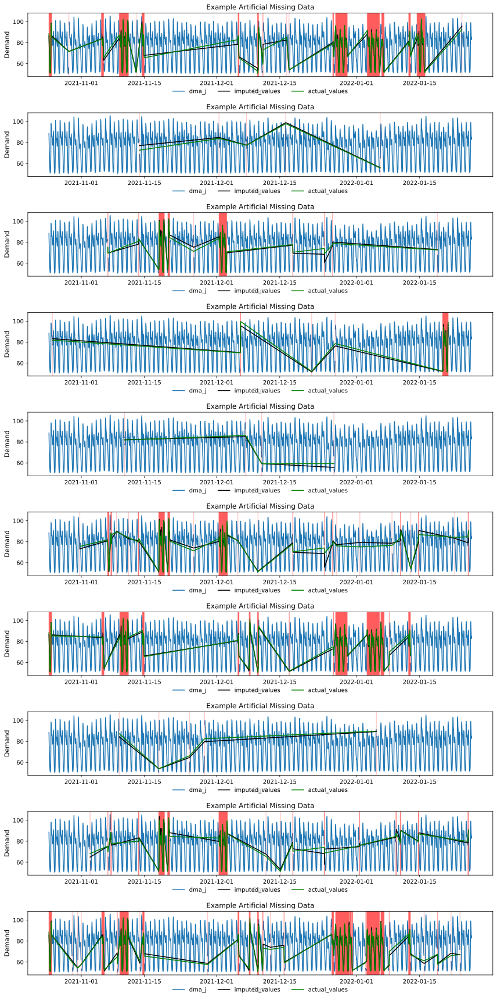

In [32]:
# plot example of imputation
fig, axs = plt.subplots(10, 1, figsize=(12, 24))

for i in np.arange(10): 
    test = 4*i
    df_example = artificial_missing['dma_e'][test]
    axs[i].plot(df_example, label=col)
    
    missing_vals = df_example[df_example['dma_e'].isna()].index
    
    # highlight missing data
    for index, row in df_example[df_example['dma_e'].isna()==True].iterrows(): 
        if row.isna().sum() / len(row) > 0.5: 
            axs[i].axvline(x=index, ymin=0, ymax=1, color='r', alpha=0.2)
    
    axs[i].plot(artificial_imputed_knnhybrid['dma_e'][test].loc[missing_vals], label='imputed_values', color='k')
    axs[i].plot(test_sets['dma_e'].loc[missing_vals], label='actual_values', color='g')

    axs[i].set_title(f"Example Artificial Missing Data")
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Demand')
    
    leg = axs[i].legend(loc='upper center', bbox_to_anchor=(0.5, -0.1),
    fancybox=False, shadow=False, ncol=6, edgecolor='w', borderpad=0.5)
    leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()

In [33]:
from utils.metrics import scores

# fitted methods
impute_methods = [
    artificial_imputed_rollmean,
    artificial_imputed_knn,
    artificial_imputed_spline,
    artificial_imputed_rolling,
    artificial_imputed_nocf,
    artificial_imputed_mean,
    artificial_imputed_median, 
    artificial_imputed_knnhybrid, 
    artificial_imputed_seasonal, 
    artificial_imputed_mf
]

impute_method_labels = [
    'rolling_mean',
    'knn', 
    'spline',
    'rolling',
    'nocf',
    'mean',
    'median', 
    'hybrid', 
    'seasonal', 
    'miss_forest'
]
  
for dma in artificial_missing.keys(): 
    print(f"Getting scores for {dma}...")
    
    # initialise score df
    df_scores = pd.DataFrame(index=['RMSE','MAPE','MAE'], columns=impute_method_labels)
    df_scores = df_scores.fillna(0)
    
    for n, method in enumerate(impute_methods):
        # concat all test cases together
        test_df = pd.DataFrame()
        # concat test set as many times as test cases
        obs_df = pd.DataFrame()
        
        for test in method[dma].keys(): 
            test_df = pd.concat([test_df,method[dma][test]], ignore_index=True)
            obs_df = pd.concat([obs_df,test_sets[dma]], ignore_index=True)
            
        score_df = scores(obs_df.values, test_df.values).fillna(0)
        df_scores[impute_method_labels[n]] = score_df['value']
    
    print('\n')
    print(df_scores)
    print('\n')
    

Getting scores for dma_e...


AttributeError: 'numpy.ndarray' object has no attribute 'columns'

### Apply Best Method

In [ ]:
# apply best method to real dataset
# fit method to artificial missing data

# get correlation partners
partners = CorrPartner(inflow_data, thresh=0.7, period=12)
missing_dma_indices = {}
df = inflow_data.copy()

for dma in inflow_data.columns: 
    # 1. apply mean method
    # where partner data not available replace with avg.
    cols = partners[dma]+[dma]  # correlated partner set
    missing_dma_indices = df[df[cols].isna().all(axis=1)].index
    df.loc[missing_dma_indices, dma] = SimpleStatDayImpute(df, dma, stat='mean')[missing_dma_indices]
    
    # apply kNN
    #df[dma] = KNNImpute(df.copy(), dma, partners, k=3)[dma]
    df[dma] = IterativeImpute(df.copy(), dma, partners)[dma]

imputed_inflow_data = df

In [ ]:
# plot example of imputation
fig, axs = plt.subplots(10, 1, figsize=(12, 24))

for i, dma in enumerate(inflow_data.columns): 
    axs[i].plot(inflow_data[dma], label=dma, zorder=2, linewidth=0.2)
    
    missing_vals = imputed_inflow_data[imputed_inflow_data[dma].isna()].index
    
    # highlight missing data
    for index, row in inflow_data[inflow_data[dma].isna()==True].iterrows(): 
        axs[i].axvline(x=index, ymin=0, ymax=1, color='r', zorder=0, linewidth=0.2)
    
    axs[i].plot(imputed_inflow_data[dma], label='imputed_values', color='k', zorder=1, linewidth=0.2)

    axs[i].set_title(f"Example Artificial Missing Data")
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Demand')
    
    leg = axs[i].legend(loc='upper center', bbox_to_anchor=(0.5, -0.1),
    fancybox=False, shadow=False, ncol=6, edgecolor='w', borderpad=0.5)
    leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()

### Get Diurnal Flow

In [ ]:
# FUNCTIONS
def SimpleMeanForecast(df, dma, stat='mean', res_window=24*2, train_window=2, residual_correction=True): 
    """
    Fills missing data values with the average for that day 
    and hour
    
    df - total dataframe of all dma
    dma - dma of interest
    res_window - period for rolling mean of residual
    train_window - length of training window in weeks
    
    """
    
    # exponential mean component
    avg_df = df[[dma]].copy() 
    # remove test period
    avg_df.iloc[-168:, :] = np.nan
    
    avg_df['mean'] = 0
    
    # fill with nan mean for insufficient data for exponential
    avg_df['day'] = avg_df.index.weekday
    avg_df['hour'] = avg_df.index.hour
    
    if stat == 'mean': 
        avg_values = avg_df.groupby(by=['day', 'hour']).mean()[dma]
    elif stat == 'median': 
        avg_values = avg_df.groupby(by=['day', 'hour']).median()[dma]
        
    for idx, row in avg_df.iterrows(): 
        avg_df.loc[idx, 'mean'] = avg_values.loc[row.day, row.hour]
        
    if residual_correction: 
        # residual correction component
        avg_df['residual'] = avg_df[dma] - avg_df['mean']
        avg_df['residual'] = avg_df['residual'].fillna(method='ffill')
        avg_df['res_correction'] = avg_df['residual'].rolling(window=res_window, min_periods=1).mean()
        avg_df['mean'] = avg_df['mean'] + avg_df['res_correction'].fillna(0)

    return avg_df['mean']

inflow_diurnal_df = pd.DataFrame(index=imputed_inflow_data.index)

# get diurnal flows
for dma in imputed_inflow_data.columns: 
    
    forecast = SimpleMeanForecast(
        imputed_inflow_data, 
        dma, 
        stat='mean', 
        res_window=24*7,  
        residual_correction=False
    )
    
    inflow_diurnal_df[dma] = forecast 
    

### Save Data

In [ ]:
inflow_diurnal_df[-168*2:].plot()

In [ ]:
### Save Data#save imputed data
imputed_inflow_data.to_csv('../data/InflowDataImputed.csv')
inflow_diurnal_df.to_csv('../data/DiurnalDataImputed.csv')
weather_data_imputed.to_csv('../data/WeatherDataImputed.csv')
